<a href="https://colab.research.google.com/github/MaDufie/ml_journey/blob/feature%2Fprediction-may-2024/flight_data_eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
#connect to google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix
from scipy import stats
import networkx as nx

In [4]:
flight_df = pd.read_csv('/content/drive/MyDrive/My ML Journey/flight_arrival_delay_prediction/data/may_2024_data/T_ONTIME_MARKETING_2405.csv')

# Exploring Flight Data

## Flight Data Info

In [5]:
flight_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 649428 entries, 0 to 649427
Data columns (total 38 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   YEAR                 649428 non-null  int64  
 1   QUARTER              649428 non-null  int64  
 2   MONTH                649428 non-null  int64  
 3   DAY_OF_MONTH         649428 non-null  int64  
 4   DAY_OF_WEEK          649428 non-null  int64  
 5   FL_DATE              649428 non-null  object 
 6   MKT_UNIQUE_CARRIER   649428 non-null  object 
 7   MKT_CARRIER_FL_NUM   649428 non-null  int64  
 8   ORIGIN_AIRPORT_ID    649428 non-null  int64  
 9   ORIGIN               649428 non-null  object 
 10  ORIGIN_CITY_NAME     649428 non-null  object 
 11  ORIGIN_STATE_ABR     649428 non-null  object 
 12  DEST_AIRPORT_ID      649428 non-null  int64  
 13  DEST                 649428 non-null  object 
 14  DEST_CITY_NAME       649428 non-null  object 
 15  DEST_STATE_ABR   

In [6]:
flight_df.head()

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,MKT_UNIQUE_CARRIER,MKT_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,...,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY
0,2024,2,5,1,3,5/1/2024 12:00:00 AM,AA,1,12478,JFK,...,389.0,363.0,336.0,1.0,2475.0,NaN,NaN,NaN,NaN,NaN
1,2024,2,5,1,3,5/1/2024 12:00:00 AM,AA,10,12892,LAX,...,330.0,326.0,298.0,1.0,2475.0,NaN,NaN,NaN,NaN,NaN
2,2024,2,5,1,3,5/1/2024 12:00:00 AM,AA,1002,15919,XNA,...,82.0,71.0,48.0,1.0,280.0,NaN,NaN,NaN,NaN,NaN
3,2024,2,5,1,3,5/1/2024 12:00:00 AM,AA,1003,11292,DEN,...,237.0,234.0,207.0,1.0,1709.0,NaN,NaN,NaN,NaN,NaN
4,2024,2,5,1,3,5/1/2024 12:00:00 AM,AA,1004,10721,BOS,...,149.0,157.0,113.0,1.0,728.0,NaN,NaN,NaN,NaN,NaN


## Descriptive Statistics

In [7]:
flight_df.describe()

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,MKT_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,CRS_DEP_TIME,DEP_TIME,...,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY
count,649428.0,649428.0,649428.0,649428.000000,649428.000000,649428.000000,649428.000000,649428.000000,649428.000000,640475.000000,...,649428.000000,637694.000000,637694.000000,649428.0,649428.000000,166497.000000,166497.000000,166497.000000,166497.000000,166497.000000
mean,2024.0,2.0,5.0,16.065898,3.972425,2688.154946,12649.072784,12648.982694,1331.919946,1339.197987,...,142.537685,138.717684,112.402165,1.0,805.557563,22.812321,5.751737,15.396398,0.104669,33.265056
std,0.0,0.0,0.0,8.962458,1.913141,1768.360782,1527.080596,1527.131838,492.395536,514.352596,...,71.238202,71.935840,69.965607,0.0,589.039647,71.689198,36.775560,35.239231,3.320672,67.775335
min,2024.0,2.0,5.0,1.000000,1.000000,1.000000,10135.000000,10135.000000,1.000000,1.000000,...,22.000000,16.000000,8.000000,1.0,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2024.0,2.0,5.0,8.000000,2.000000,1226.000000,11292.000000,11292.000000,912.000000,913.000000,...,90.000000,86.000000,61.000000,1.0,376.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2024.0,2.0,5.0,16.000000,4.000000,2335.000000,12889.000000,12889.000000,1325.000000,1330.000000,...,125.000000,121.000000,95.000000,1.0,647.000000,2.000000,0.000000,1.000000,0.000000,7.000000
75%,2024.0,2.0,5.0,24.000000,5.000000,4060.000000,14027.000000,14027.000000,1740.000000,1754.000000,...,172.000000,169.000000,142.000000,1.0,1042.000000,19.000000,0.000000,18.000000,0.000000,40.000000
max,2024.0,2.0,5.0,31.000000,7.000000,9694.000000,16869.000000,16869.000000,2359.000000,2400.000000,...,670.000000,723.000000,649.000000,1.0,5095.000000,2911.000000,1728.000000,1320.000000,656.000000,2034.000000


## Checking for missing values and duplicates

In [8]:
flight_df.isnull().sum()

,0
YEAR,0
QUARTER,0
MONTH,0
DAY_OF_MONTH,0
DAY_OF_WEEK,0
FL_DATE,0
MKT_UNIQUE_CARRIER,0
MKT_CARRIER_FL_NUM,0
ORIGIN_AIRPORT_ID,0
ORIGIN,0


In [9]:
flight_df.nunique()

,0
YEAR,1
QUARTER,1
MONTH,1
DAY_OF_MONTH,31
DAY_OF_WEEK,7
FL_DATE,31
MKT_UNIQUE_CARRIER,10
MKT_CARRIER_FL_NUM,6402
ORIGIN_AIRPORT_ID,352
ORIGIN,352


In [10]:
# Checking for duplicate rows
flight_duplicates = flight_df.duplicated()

# Counting the number of duplicate rows
num_flight_duplicates = flight_duplicates.sum()

# Displaying the duplicate rows
flight_duplicate_rows = flight_df[flight_duplicates]

print(f"Number of duplicate Flight rows: {num_flight_duplicates}")
print("Duplicate Flight rows:")
print(flight_duplicate_rows)

Number of duplicate Flight rows: 0
Duplicate Flight rows:
Empty DataFrame
Columns: [YEAR, QUARTER, MONTH, DAY_OF_MONTH, DAY_OF_WEEK, FL_DATE, MKT_UNIQUE_CARRIER, MKT_CARRIER_FL_NUM, ORIGIN_AIRPORT_ID, ORIGIN, ORIGIN_CITY_NAME, ORIGIN_STATE_ABR, DEST_AIRPORT_ID, DEST, DEST_CITY_NAME, DEST_STATE_ABR, CRS_DEP_TIME, DEP_TIME, DEP_DELAY, DEP_DELAY_NEW, DEP_DELAY_GROUP, TAXI_OUT, TAXI_IN, CRS_ARR_TIME, ARR_TIME, ARR_DELAY, ARR_DELAY_NEW, ARR_DELAY_GROUP, CRS_ELAPSED_TIME, ACTUAL_ELAPSED_TIME, AIR_TIME, FLIGHTS, DISTANCE, CARRIER_DELAY, WEATHER_DELAY, NAS_DELAY, SECURITY_DELAY, LATE_AIRCRAFT_DELAY]
Index: []

[0 rows x 38 columns]


## Cleaning Flight Data

In [11]:
# Dropping unneeded columns in flight_df and remove rows with null values in 'ARR_DELAY_NEW'
flight_df_new = flight_df.drop(columns=['FL_DATE', 'FLIGHTS', 'DEP_DELAY_GROUP', 'ARR_DELAY_GROUP'])
flight_df_new = flight_df_new.dropna(subset=['ARR_DELAY_NEW'])

# Removing rows where 'DAY_OF_WEEK' has a value of 9
flight_df_new = flight_df_new[flight_df_new['DAY_OF_WEEK'] != 9]

# Resetting the index after dropping rows
flight_df_new.reset_index(drop=True, inplace=True)

# Converting time columns (CRS_DEP_TIME, DEP_TIME, CRS_ARR_TIME, ARR_TIME) to hour only (HH)
def extract_hour(time_val):
    return int(time_val // 100)

time_columns = ['CRS_DEP_TIME', 'DEP_TIME', 'CRS_ARR_TIME', 'ARR_TIME']
for col in time_columns:
    flight_df_new[col + '_HH'] = flight_df_new[col].apply(extract_hour)

# changing the NaN to 0 for the following columns CARRIER_DELAY, WEATHER_DELAY, NAS_DELAY, SECURITY_DELAY, LATE_AIRCRAFT_DELAY
columns_to_fill = ['CARRIER_DELAY', 'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY']
flight_df_new[columns_to_fill] = flight_df_new[columns_to_fill].fillna(0)

# removing outliers with zscore
z_scores = np.abs(stats.zscore(flight_df_new['ARR_DELAY_NEW']))
flight_df_new = flight_df_new[z_scores < 3]

In [12]:
flight_df_new.sample(10)

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,MKT_UNIQUE_CARRIER,MKT_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_CITY_NAME,...,DISTANCE,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,CRS_DEP_TIME_HH,DEP_TIME_HH,CRS_ARR_TIME_HH,ARR_TIME_HH
472932,2024,2,5,23,4,WN,4285,11292,DEN,"Denver, CO",...,967.0,99.0,0.0,10.0,0.0,0.0,18,20,20,22
206757,2024,2,5,11,6,AA,1113,13303,MIA,"Miami, FL",...,1085.0,52.0,0.0,0.0,0.0,67.0,19,21,22,0
429872,2024,2,5,21,2,WN,2493,10693,BNA,"Nashville, TN",...,1587.0,0.0,0.0,0.0,0.0,0.0,7,7,9,9
280814,2024,2,5,14,2,UA,1527,13930,ORD,"Chicago, IL",...,1514.0,0.0,0.0,0.0,0.0,0.0,16,16,18,18
573142,2024,2,5,28,2,WN,3706,13232,MDW,"Chicago, IL",...,668.0,0.0,0.0,0.0,0.0,0.0,6,6,9,9
548530,2024,2,5,27,1,UA,2172,15304,TPA,"Tampa, FL",...,811.0,0.0,0.0,0.0,0.0,0.0,18,18,21,21
284710,2024,2,5,14,2,WN,2006,13796,OAK,"Oakland, CA",...,723.0,0.0,0.0,23.0,0.0,0.0,19,19,21,21
143544,2024,2,5,8,3,AA,1162,11298,DFW,"Dallas/Fort Worth, TX",...,1188.0,0.0,0.0,39.0,0.0,0.0,19,19,20,20
339650,2024,2,5,17,5,DL,5200,12953,LGA,"New York, NY",...,963.0,0.0,0.0,0.0,0.0,0.0,14,14,16,16
598977,2024,2,5,30,4,AA,5531,11066,CMH,"Columbus, OH",...,347.0,0.0,0.0,0.0,0.0,0.0,11,11,13,13


array([[<Axes: title={'center': 'YEAR'}>,
        <Axes: title={'center': 'QUARTER'}>,
        <Axes: title={'center': 'MONTH'}>,
        <Axes: title={'center': 'DAY_OF_MONTH'}>,
        <Axes: title={'center': 'DAY_OF_WEEK'}>],
       [<Axes: title={'center': 'MKT_CARRIER_FL_NUM'}>,
        <Axes: title={'center': 'ORIGIN_AIRPORT_ID'}>,
        <Axes: title={'center': 'DEST_AIRPORT_ID'}>,
        <Axes: title={'center': 'CRS_DEP_TIME_HH'}>,
        <Axes: title={'center': 'DEP_TIME_HH'}>],
       [<Axes: title={'center': 'DEP_DELAY'}>,
        <Axes: title={'center': 'DEP_DELAY_NEW'}>,
        <Axes: title={'center': 'TAXI_OUT'}>,
        <Axes: title={'center': 'TAXI_IN'}>,
        <Axes: title={'center': 'CRS_ARR_TIME_HH'}>],
       [<Axes: title={'center': 'ARR_TIME_HH'}>,
        <Axes: title={'center': 'ARR_DELAY'}>,
        <Axes: title={'center': 'ARR_DELAY_NEW'}>,
        <Axes: title={'center': 'CRS_ELAPSED_TIME'}>,
        <Axes: title={'center': 'ACTUAL_ELAPSED_TIME'}>],
 

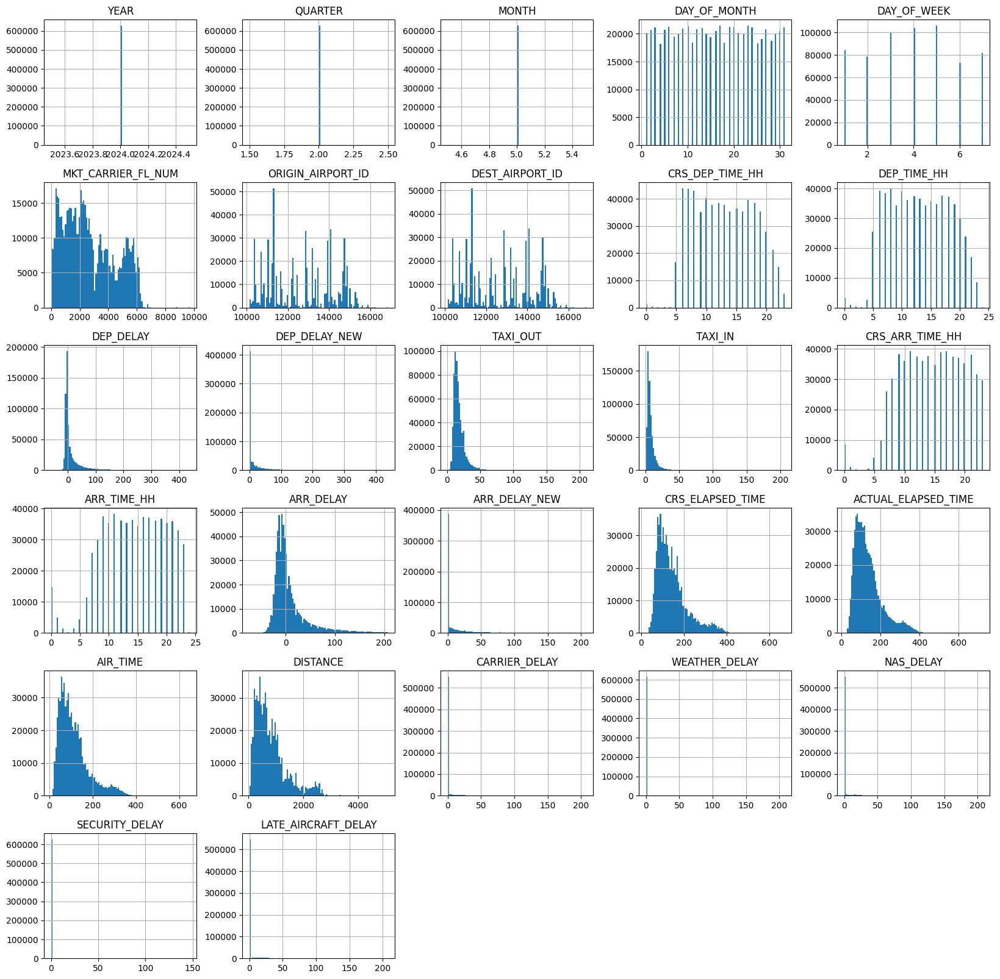

In [13]:
flight_df_new[['YEAR', 'QUARTER', 'MONTH', 'DAY_OF_MONTH', 'DAY_OF_WEEK','MKT_UNIQUE_CARRIER', 'MKT_CARRIER_FL_NUM', 'ORIGIN_AIRPORT_ID', 'ORIGIN',
               'ORIGIN_CITY_NAME', 'ORIGIN_STATE_ABR', 'DEST_AIRPORT_ID', 'DEST', 'DEST_CITY_NAME', 'DEST_STATE_ABR', 'CRS_DEP_TIME_HH', 'DEP_TIME_HH',
               'DEP_DELAY', 'DEP_DELAY_NEW', 'TAXI_OUT', 'TAXI_IN', 'CRS_ARR_TIME_HH', 'ARR_TIME_HH', 'ARR_DELAY', 'ARR_DELAY_NEW', 'CRS_ELAPSED_TIME',
               'ACTUAL_ELAPSED_TIME', 'AIR_TIME', 'DISTANCE', 'CARRIER_DELAY', 'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY']].hist(bins=100,figsize=(20,20))

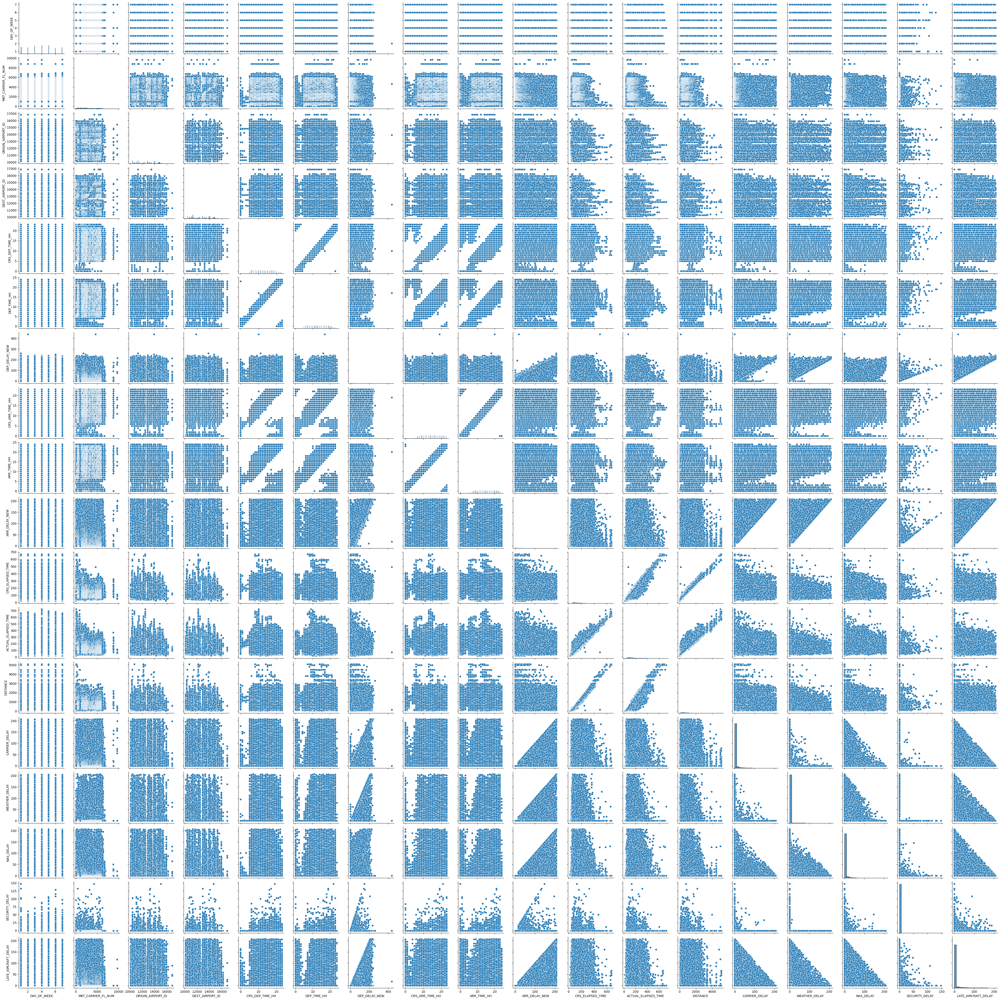

In [ ]:
features = ['DAY_OF_WEEK', 'MKT_CARRIER_FL_NUM', 'ORIGIN_AIRPORT_ID', 'DEST_AIRPORT_ID', 'CRS_DEP_TIME_HH', 'DEP_TIME_HH', 'DEP_DELAY_NEW', 'CRS_ARR_TIME_HH', 'ARR_TIME_HH',
              'ARR_DELAY_NEW', 'CRS_ELAPSED_TIME', 'ACTUAL_ELAPSED_TIME','DISTANCE', 'CARRIER_DELAY', 'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY' ]
sns.pairplot(flight_df_new[features])

# Feature Engineering

## Time of Day
*   Creating a new feature to determine if the flight was in the morning or evening


In [14]:
def get_time_of_day(hour):
    if hour is None:
        return None
    if 300 <= hour < 720:  # 5AM to 12PM
        return 'Morning'
    elif 720 <= hour < 1080:  # 12PM to 6PM
        return 'Afternoon'
    elif 1080 <= hour < 1320: # 6PM to 10PM
        return 'Evening'
    else:
        return 'Night'

flight_df_new['CRS_DEP_TIME_OF_DAY'] = flight_df_new['CRS_DEP_TIME'].apply(get_time_of_day)
flight_df_new['CRS_ARR_TIME_OF_DAY'] = flight_df_new['CRS_ARR_TIME'].apply(get_time_of_day)

## Arrival Delay Class
*   Creating a new column ARR_DELAY_CLASS where the value is 1 if ARR_DELAY_NEW is 15 minutes or more, and 0 if it's less than 15 minutes.

In [15]:
# Using Delayed if ARR_DELAY_NEW is 15 minutes or more
flight_df_new['ARR_DELAY_CLASS'] = flight_df_new['ARR_DELAY_NEW'].apply(lambda x: 1 if x >= 15 else 0)
flight_df_new['ARR_DELAY_CLASS'].value_counts(normalize=True)

,proportion
ARR_DELAY_CLASS,
0,0.750888
1,0.249112


## Carrier Number

In [16]:
flight_df_new['CARRIER_NUM'] = flight_df_new['MKT_UNIQUE_CARRIER'].astype(str) + flight_df_new['MKT_CARRIER_FL_NUM'].astype(str)

In [17]:
flight_df_new.head()

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,MKT_UNIQUE_CARRIER,MKT_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_CITY_NAME,...,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,CRS_DEP_TIME_HH,DEP_TIME_HH,CRS_ARR_TIME_HH,ARR_TIME_HH,CRS_DEP_TIME_OF_DAY,CRS_ARR_TIME_OF_DAY,ARR_DELAY_CLASS,CARRIER_NUM
0,2024,2,5,1,3,AA,1,12478,JFK,"New York, NY",...,0.0,0.0,9,9,12,12,Afternoon,Evening,0,AA1
1,2024,2,5,1,3,AA,10,12892,LAX,"Los Angeles, CA",...,0.0,0.0,22,22,7,6,Night,Morning,0,AA10
2,2024,2,5,1,3,AA,1002,15919,XNA,"Fayetteville, AR",...,0.0,0.0,6,6,7,7,Morning,Afternoon,0,AA1002
3,2024,2,5,1,3,AA,1003,11292,DEN,"Denver, CO",...,0.0,0.0,0,0,6,6,Night,Morning,0,AA1003
4,2024,2,5,1,3,AA,1004,10721,BOS,"Boston, MA",...,0.0,0.0,8,7,10,10,Afternoon,Afternoon,0,AA1004


# Correlation Matrix

<Axes: >

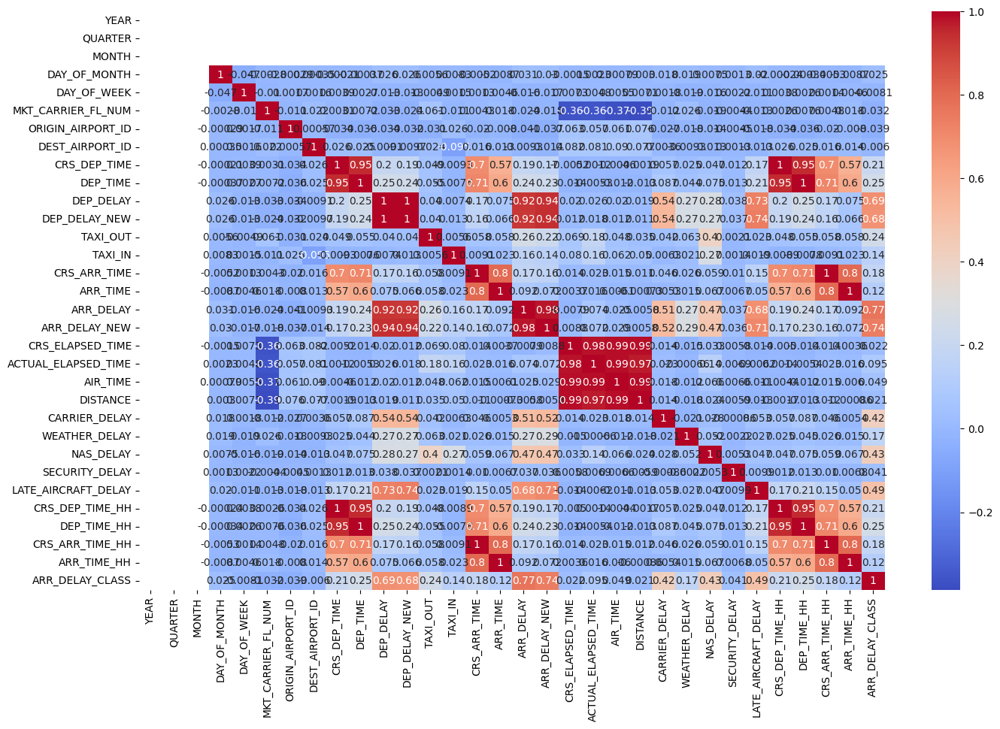

In [38]:
plt.figure(figsize=(16,10))
numerical_df = flight_df_new.select_dtypes(include=['number'])
correlation_matrix = numerical_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# Directed Graph
Creating a directed graph with "ORIGIN" & "DEST" as nodes and "CRS_ELAPSED_TIME" as edge weight

In [20]:
graph = nx.DiGraph()

# Creating a subset of the columns (ORIGIN, DEST, CRS_ELAPSED_TIME) and drop duplicates for (ORIGIN, DEST) pairs
graph_data = flight_df_new[['ORIGIN', 'DEST', 'CRS_ELAPSED_TIME']].drop_duplicates(subset=['ORIGIN', 'DEST'])

# Adding edges to the graph, using ORIGIN and DEST as nodes and CRS_ELAPSED_TIME as edge weight
for _, row in graph_data.iterrows():
    origin = row['ORIGIN']
    dest = row['DEST']
    elapsed_time = row['CRS_ELAPSED_TIME']
    graph.add_edge(origin, dest, weight=elapsed_time)

# Output the number of nodes and edges as a verification
graph.number_of_nodes(), graph.number_of_edges()

(352, 6052)

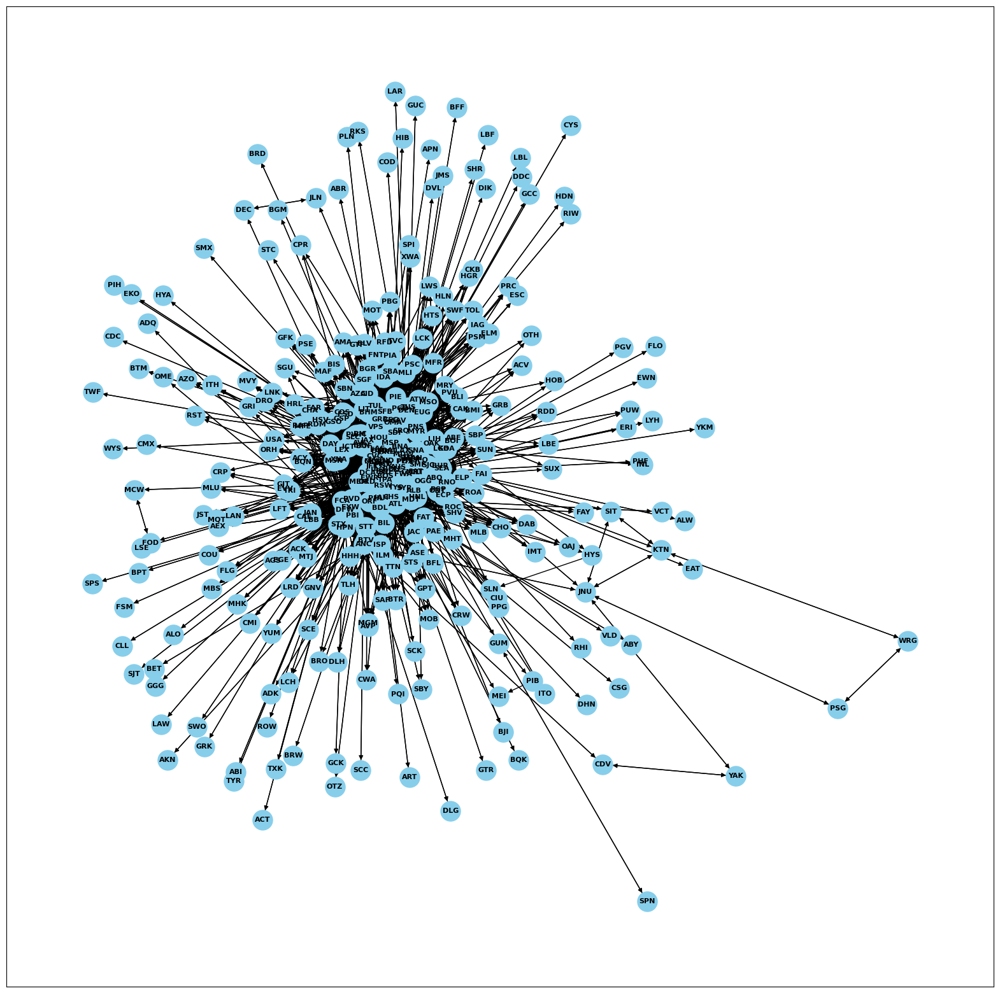

In [21]:
pos = nx.spring_layout(graph)

# use nx.draw_networkx to show graph
plt.figure(figsize=(20, 20))
nx.draw_networkx(graph, pos, with_labels=True, node_size=500, node_color='skyblue', font_size=8, font_color='black', font_weight='bold')
plt.show()

## In-Degree Centrality

The percentage of flights coming to a particular node (Airport)

In [22]:
in_degree_centrality = nx.in_degree_centrality(graph)

# Display the in-degree centrality for each node
# for node, centrality in in_degree_centrality.items():
#     print(f"{node}: {centrality}")
in_degree_df = pd.DataFrame(list(in_degree_centrality.items()), columns=['Node', 'In-Degree Centrality'])
in_degree_df = in_degree_df.sort_values(by='In-Degree Centrality', ascending=False)

in_degree_df.head(10)

,Node,In-Degree Centrality
3,DFW,0.501425
4,DEN,0.487179
17,ORD,0.450142
9,ATL,0.415954
7,CLT,0.378917
63,LAS,0.347578
73,IAH,0.304843
53,MSP,0.301994
29,PHX,0.284900
22,DCA,0.282051


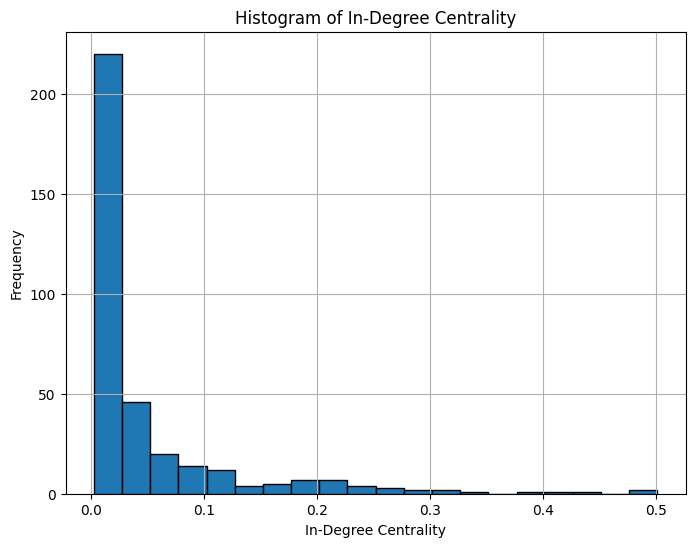

In [23]:
# Extracting the centrality values
centrality_values = list(in_degree_centrality.values())

plt.figure(figsize=(8, 6))
plt.hist(centrality_values, bins=20, edgecolor='black')
plt.title('Histogram of In-Degree Centrality')
plt.xlabel('In-Degree Centrality')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

## Out-Degree Centrality
The percentage of flights moving from a particular node (Airport)

In [24]:
out_degree_centrality = nx.out_degree_centrality(graph)

out_degree_df = pd.DataFrame(list(out_degree_centrality.items()), columns=['Node', 'Out-Degree Centrality'])
out_degree_df = out_degree_df.sort_values(by='Out-Degree Centrality', ascending=False)

out_degree_df.head(10)

,Node,Out-Degree Centrality
3,DFW,0.501425
4,DEN,0.487179
17,ORD,0.450142
9,ATL,0.415954
7,CLT,0.378917
63,LAS,0.350427
73,IAH,0.304843
53,MSP,0.301994
29,PHX,0.284900
22,DCA,0.282051


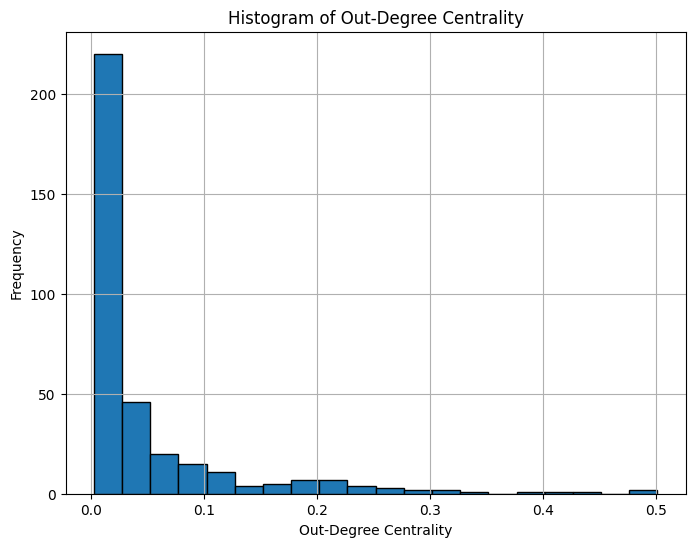

In [25]:
out_centrality_values = list(out_degree_centrality.values())

plt.figure(figsize=(8, 6))
plt.hist(out_centrality_values, bins=20, edgecolor='black')
plt.title('Histogram of Out-Degree Centrality')
plt.xlabel('Out-Degree Centrality')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

### Betweenness Centrality
analyzing how often a node lies on the shortest paths between other nodes. It quantifies the degree to which a node acts as an intermediary

In [26]:
betweenness_centrality = nx.betweenness_centrality(graph)

betweenness_centrality_df = pd.DataFrame(list(betweenness_centrality.items()), columns=['Node', 'Betweenness Centrality'])
betweenness_centrality_df = betweenness_centrality_df.sort_values(by='Betweenness Centrality', ascending=False)

betweenness_centrality_df.head(10)

,Node,Betweenness Centrality
4,DEN,0.174739
3,DFW,0.173562
17,ORD,0.120712
9,ATL,0.087288
7,CLT,0.075395
53,MSP,0.067109
94,SEA,0.063089
186,ANC,0.062191
63,LAS,0.045837
57,SLC,0.045239


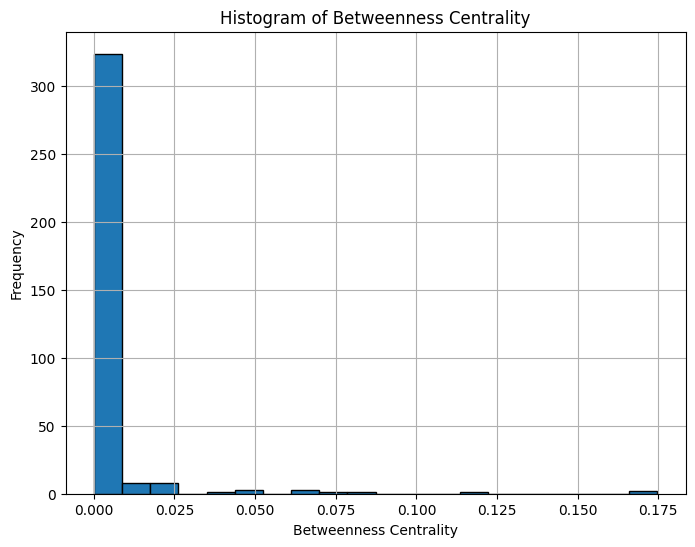

In [27]:
betweenness_centrality_values = list(betweenness_centrality.values())

plt.figure(figsize=(8, 6))
plt.hist(betweenness_centrality_values, bins=20, edgecolor='black')
plt.title('Histogram of Betweenness Centrality')
plt.xlabel('Betweenness Centrality')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

### Closeness Centrality
represents how “close” a node is to all other nodes in the network. A higher closeness centrality score indicates that a node is more central, meaning it has shorter average distances to all other nodes. That node / airport is directly connected or “just a hop away” from most others in the network.

In [28]:
closeness_centrality = nx.closeness_centrality(graph)

closeness_centrality_df = pd.DataFrame(list(closeness_centrality.items()), columns=['Node', 'Closeness Centrality'])
closeness_centrality_df = closeness_centrality_df.sort_values(by='Closeness Centrality', ascending=False)

closeness_centrality_df.head(10)

,Node,Closeness Centrality
3,DFW,0.657303
4,DEN,0.651206
17,ORD,0.635870
9,ATL,0.622340
63,LAS,0.593909
7,CLT,0.593909
53,MSP,0.582090
73,IAH,0.579208
29,PHX,0.572594
94,SEA,0.568882


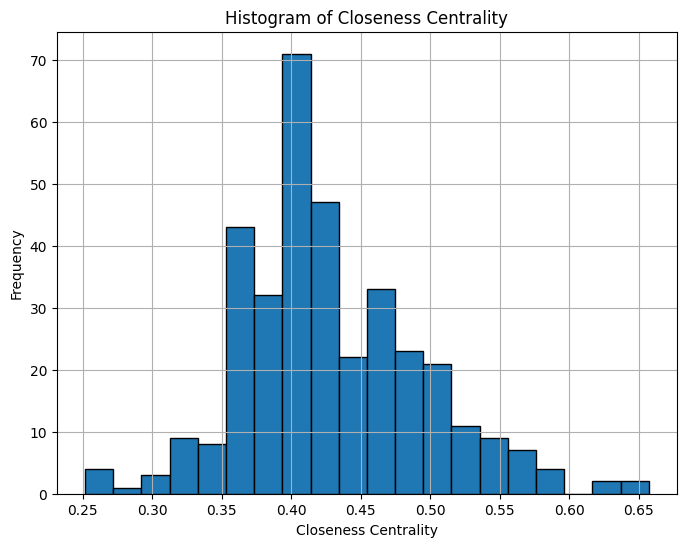

In [29]:
closeness_centrality_values = list(closeness_centrality.values())

plt.figure(figsize=(8, 6))
plt.hist(closeness_centrality_values, bins=20, edgecolor='black')
plt.title('Histogram of Closeness Centrality')
plt.xlabel('Closeness Centrality')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

## Correlation Matrix of Centrality Measures

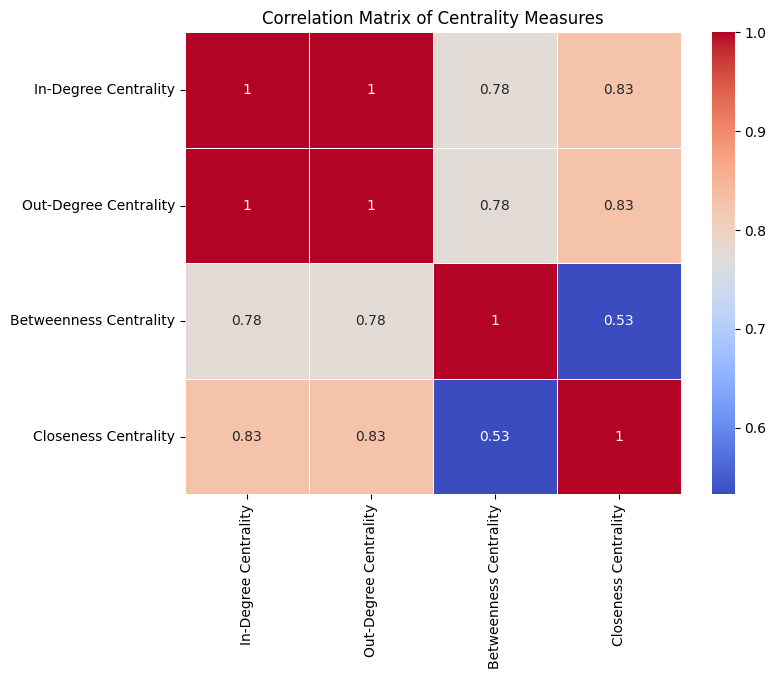

In [30]:
# Combining all centrality measures into a DataFrame
centrality_data = pd.DataFrame({
    'In-Degree Centrality': in_degree_centrality,
    'Out-Degree Centrality': out_degree_centrality,
    'Betweenness Centrality': betweenness_centrality,
    'Closeness Centrality': closeness_centrality
})

correlation_matrix = centrality_data.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Centrality Measures')
plt.show()

In [31]:
centrality_data

,In-Degree Centrality,Out-Degree Centrality,Betweenness Centrality,Closeness Centrality
JFK,0.188034,0.188034,1.821145e-02,0.532625
LAX,0.262108,0.262108,1.775394e-02,0.565217
XNA,0.054131,0.054131,6.544044e-04,0.483471
DFW,0.501425,0.501425,1.735623e-01,0.657303
DEN,0.487179,0.487179,1.747393e-01,0.651206
...,...,...,...,...
STC,0.002849,0.002849,0.000000e+00,0.288414
WYS,0.002849,0.002849,0.000000e+00,0.358163
ACK,0.019943,0.019943,1.165076e-05,0.400685
MVY,0.008547,0.008547,9.168181e-07,0.369863


## Merging Centrality Data with Dataframe

In [32]:
# merge centrality_data with data_cleaned with on "ORIGIN" feature.
centrality_data_origin = centrality_data.copy()
centrality_data_origin.index.name = 'ORIGIN'
centrality_data_origin.reset_index(inplace=True)

centrality_data_origin.head()

,ORIGIN,In-Degree Centrality,Out-Degree Centrality,Betweenness Centrality,Closeness Centrality
0,JFK,0.188034,0.188034,0.018211,0.532625
1,LAX,0.262108,0.262108,0.017754,0.565217
2,XNA,0.054131,0.054131,0.000654,0.483471
3,DFW,0.501425,0.501425,0.173562,0.657303
4,DEN,0.487179,0.487179,0.174739,0.651206


In [33]:
data_new_origin = flight_df_new.merge(centrality_data_origin, on='ORIGIN', suffixes=('_ORIGIN', '_ORIGIN'))
data_new_origin

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,MKT_UNIQUE_CARRIER,MKT_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_CITY_NAME,...,CRS_ARR_TIME_HH,ARR_TIME_HH,CRS_DEP_TIME_OF_DAY,CRS_ARR_TIME_OF_DAY,ARR_DELAY_CLASS,CARRIER_NUM,In-Degree Centrality,Out-Degree Centrality,Betweenness Centrality,Closeness Centrality
0,2024,2,5,1,3,AA,1,12478,JFK,"New York, NY",...,12,12,Afternoon,Evening,0,AA1,0.188034,0.188034,0.018211,0.532625
1,2024,2,5,1,3,AA,1017,12478,JFK,"New York, NY",...,8,8,Morning,Afternoon,0,AA1017,0.188034,0.188034,0.018211,0.532625
2,2024,2,5,1,3,AA,1032,12478,JFK,"New York, NY",...,9,9,Morning,Afternoon,0,AA1032,0.188034,0.188034,0.018211,0.532625
3,2024,2,5,1,3,AA,1095,12478,JFK,"New York, NY",...,20,19,Night,Night,0,AA1095,0.188034,0.188034,0.018211,0.532625
4,2024,2,5,1,3,AA,117,12478,JFK,"New York, NY",...,23,23,Night,Night,0,AA117,0.188034,0.188034,0.018211,0.532625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
627515,2024,2,5,27,1,B6,1963,12250,HYA,"Hyannis, MA",...,14,14,Night,Night,0,B61963,0.002849,0.002849,0.000000,0.347869
627516,2024,2,5,28,2,B6,1963,12250,HYA,"Hyannis, MA",...,14,14,Night,Night,0,B61963,0.002849,0.002849,0.000000,0.347869
627517,2024,2,5,29,3,B6,1963,12250,HYA,"Hyannis, MA",...,14,16,Night,Night,1,B61963,0.002849,0.002849,0.000000,0.347869
627518,2024,2,5,30,4,B6,1963,12250,HYA,"Hyannis, MA",...,14,14,Night,Night,0,B61963,0.002849,0.002849,0.000000,0.347869


In [34]:
# merge centrality_data with data_cleaned with on "DEST" feature.
centrality_data_dest = centrality_data.copy()
centrality_data_dest.index.name = 'DEST'
centrality_data_dest.reset_index(inplace=True)

centrality_data_dest.head()

,DEST,In-Degree Centrality,Out-Degree Centrality,Betweenness Centrality,Closeness Centrality
0,JFK,0.188034,0.188034,0.018211,0.532625
1,LAX,0.262108,0.262108,0.017754,0.565217
2,XNA,0.054131,0.054131,0.000654,0.483471
3,DFW,0.501425,0.501425,0.173562,0.657303
4,DEN,0.487179,0.487179,0.174739,0.651206


In [35]:
data_new_dest = data_new_origin.merge(centrality_data_dest, on='DEST', suffixes=('_ORIGIN', '_DEST'))
data_new_dest

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,MKT_UNIQUE_CARRIER,MKT_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_CITY_NAME,...,ARR_DELAY_CLASS,CARRIER_NUM,In-Degree Centrality_ORIGIN,Out-Degree Centrality_ORIGIN,Betweenness Centrality_ORIGIN,Closeness Centrality_ORIGIN,In-Degree Centrality_DEST,Out-Degree Centrality_DEST,Betweenness Centrality_DEST,Closeness Centrality_DEST
0,2024,2,5,1,3,AA,1,12478,JFK,"New York, NY",...,0,AA1,0.188034,0.188034,0.018211,0.532625,0.262108,0.262108,0.017754,0.565217
1,2024,2,5,1,3,AA,117,12478,JFK,"New York, NY",...,0,AA117,0.188034,0.188034,0.018211,0.532625,0.262108,0.262108,0.017754,0.565217
2,2024,2,5,1,3,AA,171,12478,JFK,"New York, NY",...,0,AA171,0.188034,0.188034,0.018211,0.532625,0.262108,0.262108,0.017754,0.565217
3,2024,2,5,1,3,AA,185,12478,JFK,"New York, NY",...,0,AA185,0.188034,0.188034,0.018211,0.532625,0.262108,0.262108,0.017754,0.565217
4,2024,2,5,1,3,AA,3,12478,JFK,"New York, NY",...,1,AA3,0.188034,0.188034,0.018211,0.532625,0.262108,0.262108,0.017754,0.565217
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
627515,2024,2,5,27,1,UA,174,12016,GUM,"Guam, TT",...,0,UA174,0.005698,0.005698,0.005698,0.335885,0.002849,0.002849,0.000000,0.251613
627516,2024,2,5,28,2,UA,174,12016,GUM,"Guam, TT",...,0,UA174,0.005698,0.005698,0.005698,0.335885,0.002849,0.002849,0.000000,0.251613
627517,2024,2,5,29,3,UA,174,12016,GUM,"Guam, TT",...,0,UA174,0.005698,0.005698,0.005698,0.335885,0.002849,0.002849,0.000000,0.251613
627518,2024,2,5,30,4,UA,174,12016,GUM,"Guam, TT",...,0,UA174,0.005698,0.005698,0.005698,0.335885,0.002849,0.002849,0.000000,0.251613


In [36]:
data_new_dest.columns

Index(['YEAR', 'QUARTER', 'MONTH', 'DAY_OF_MONTH', 'DAY_OF_WEEK',
       'MKT_UNIQUE_CARRIER', 'MKT_CARRIER_FL_NUM', 'ORIGIN_AIRPORT_ID',
       'ORIGIN', 'ORIGIN_CITY_NAME', 'ORIGIN_STATE_ABR', 'DEST_AIRPORT_ID',
       'DEST', 'DEST_CITY_NAME', 'DEST_STATE_ABR', 'CRS_DEP_TIME', 'DEP_TIME',
       'DEP_DELAY', 'DEP_DELAY_NEW', 'TAXI_OUT', 'TAXI_IN', 'CRS_ARR_TIME',
       'ARR_TIME', 'ARR_DELAY', 'ARR_DELAY_NEW', 'CRS_ELAPSED_TIME',
       'ACTUAL_ELAPSED_TIME', 'AIR_TIME', 'DISTANCE', 'CARRIER_DELAY',
       'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY',
       'CRS_DEP_TIME_HH', 'DEP_TIME_HH', 'CRS_ARR_TIME_HH', 'ARR_TIME_HH',
       'CRS_DEP_TIME_OF_DAY', 'CRS_ARR_TIME_OF_DAY', 'ARR_DELAY_CLASS',
       'CARRIER_NUM', 'In-Degree Centrality_ORIGIN',
       'Out-Degree Centrality_ORIGIN', 'Betweenness Centrality_ORIGIN',
       'Closeness Centrality_ORIGIN', 'In-Degree Centrality_DEST',
       'Out-Degree Centrality_DEST', 'Betweenness Centrality_DEST',
      

# Saving Flight Data to CSV

In [40]:
data_new_dest.to_csv('flight_data.csv', index=False)